# Exercise Sheet 4 - Segmentation & Denoising with U-Net

 * Deep Learning for Computer Vision - Winter Term 2023/24
 * Organizers: Anwai Archit, Sushmita Nair, Constantin Pape
 * Tutors: Ahsan Ali, Anwai Archit, Lukas Friedrich, Piklu Mallick, Sushmita Nair, Ayush Paliwal, Paul Wollenhaupt 
 * Due date: **Tuesday**, Dec 19, before 10:00

In this assignment we will use a U-Net for two different tasks:
- semantic segmentation of nuclei in microscopy images
- denoising of natural images

## Hints

The goal of the first part of the exercise (segmentation) is to implement the U-Net architecture very similar to the original publication and then use it for its initial purpose, semantic segmentation. In the second part we will use the same U-Net implementation, but use it for a different task: denoising, following the ideas of noise-to-noise. 

To understand the background of this exercise you can:

* Review the lecture (Lecture 5 for U-Net architecture, Lecture 6 for noise-to-noise)
* Read the [U-net publication](https://arxiv.org/abs/1505.04597).
* Read the [noise-to-noise publication](https://arxiv.org/abs/1803.04189).

Note that we will implement the same ideas as in these papers, but will deviate from the implementation details and conduct different and fewer experiments.
 
*Do not hesitate to ask questions and ideally discuss them with the fellow students on Rocket Chat! We will monitor the channel to provide you help if your discussions get stuck.*

### IMPORTANT SUBMISSION INSTRUCTIONS

- **You need to answer all the questions in written form**
- When you're done, download the notebook from Kaggle and **rename** it to `Tutorial_<X>_<surname1>_<surname2>_<surname3>.ipynb`
- Only submit the Jupyter Notebook (ipynb file). No other file is required. Upload it on `Stud.IP` -> `Deep Learning for Computer Vision` -> `Files` -> `Submission for Homework 4`.
- Make only one submission of the exercise per group.
- The deadline is strict
- You have to present the exercise in the tutorials. We have a high ratio of students to tutors, so please decide which team member presents which part beforehand.

Implementation
- Only change code to replace placeholders. Leave the other code as is. In addition to the python packages loaded below you are allowed to use any packages you want.


**Import required libraries.**

In [1]:
import os
import tqdm
import zipfile
import requests
from glob import glob
from pathlib import Path

import numpy as np
import seaborn as sns
import imageio.v2 as imageio
from matplotlib import colors
import matplotlib.pyplot as plt

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.v2 as transforms

from skimage.measure import label
from skimage.util import random_noise
from scipy.optimize import linear_sum_assignment
from skimage.metrics import contingency_table, peak_signal_noise_ratio

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/opt/conda/lib/python3.10/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning

**Temporary fix for importing `skimage.segmentation` on Kaggle**

As of 30th November 2023, Kaggle has an incompatible combination of the libraries `scipy` and `skimage.segmentation`. The latter is important for this exercise, so we provide you with a hack fix to it.

Note that this issue might be fixed by the time that you worked on the exercise (we informed kaggle about it, see https://github.com/Kaggle/docker-python/issues/1331). 

In [2]:
# let's check if the import works or not
#from skimage.segmentation import find_boundaries, watershed

If the issue still prevails in Kaggle, you will get an error statement:
```python
ImportError: cannot import name 'QhullError' from 'scipy.spatial' (/opt/conda/lib/python3.10/site-packages/scipy/spatial/__init__.py)
```

NOTE 1: If you don't get this error (or are not using kaggle), please skip the next two cells and continue with the exercise.

NOTE 2: If you do get this error, please run the next two cells. They will fix the import by modifying the python library directly.

In [3]:
# DO NOT CHANGE
def fix_scipy_imports(path="/opt/conda/lib/python3.10/site-packages/skimage/morphology/convex_hull.py"):
    with open(path, "r") as f:
        file = f.read()

    i = file.find("\n", 49)
    new_file = file[:i+1] + "# " + file[i+1:]

    with open(path, "w") as f:
        f.write(new_file)

In [4]:
# the issue should now be resolved. let's try it out.
try:
    from skimage.segmentation import find_boundaries, watershed
except ImportError:
    fix_scipy_imports()
    from skimage.segmentation import find_boundaries, watershed

**The normal exercise continues here.**

In [5]:
# create a root folder where to save the data for this exercise in Kaggle
root_folder = "/kaggle/working/dlforcv-ex4"
os.makedirs(root_folder, exist_ok=True)

## Segmentation

In the first part of the exercise we will implement the U-Net architecture and apply it to segment nuclei in fluorescence microscopy images. This is an important task in microscopy image analysis in order to identify and characterize cell morphology and dynamics. The data we are using is a subset of the [Kaggle Nucleus Segmentation challenge](https://www.kaggle.com/c/data-science-bowl-2018).

### Data preparation

In [6]:
# download the data
data_folder = os.path.join(root_folder, "kaggle-data")
url = "https://github.com/stardist/stardist/releases/download/0.1.0/dsb2018.zip"
if not os.path.exists(data_folder):
    os.makedirs(data_folder)
    tmp_path = os.path.join(data_folder, "data.zip")
    with requests.get(url) as r:
        with open(tmp_path, "wb") as f:
            f.write(r.content)
    with zipfile.ZipFile(tmp_path, "r") as f:
        f.extractall(data_folder)
    os.remove(tmp_path)
data_folder = os.path.join(data_folder, "dsb2018")
assert os.path.exists(data_folder)

**Data exploration**

The data is stored in the root folder `dsb2018` and contains the two subfolders `train` and `test` with train/test split. Each of these folders contains the folders `images` with the raw image data and `masks` with the instance masks. As a first step, we will visualize some of the images and labels from the training data.

In [7]:
image_paths = glob(os.path.join(data_folder, "train", "images", "*.tif"))
image_paths.sort()
test_image_paths = glob(os.path.join(data_folder, "test", "images", "*.tif"))
test_image_paths.sort()
mask_paths = glob(os.path.join(data_folder, "train", "masks", "*.tif"))
mask_paths.sort()
test_mask_paths = glob(os.path.join(data_folder, "test", "masks", "*.tif"))
test_mask_paths.sort()
assert len(image_paths) == len(mask_paths)
assert len(test_image_paths) == len(test_mask_paths)

In [8]:
# a function to generate a random color map for a label image
def get_random_colors(labels):
    n_labels = len(np.unique(labels)) - 1
    cmap = [[0, 0, 0]] + np.random.rand(n_labels, 3).tolist()
    cmap = colors.ListedColormap(cmap)
    return cmap

In [9]:
def plot_sample(image_path, mask_path):
    image, mask = imageio.imread(image_path), imageio.imread(mask_path)
    fig, ax = plt.subplots(1, 2)
    ax[0].axis("off")
    ax[0].imshow(image, cmap="gray")
    # visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
    plt.show()

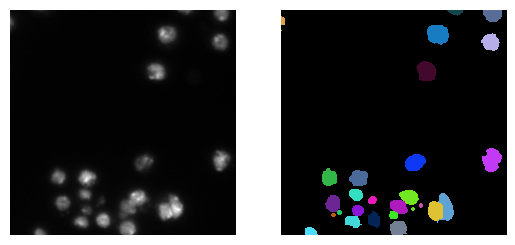

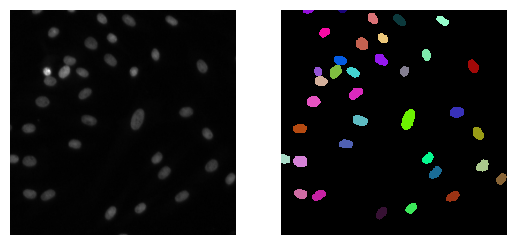

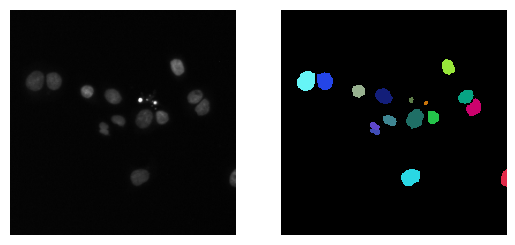

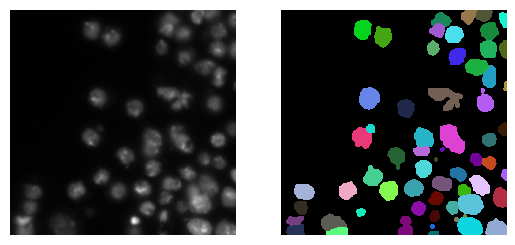

In [10]:
# plot the first 4 images
for i in range(4):
    plot_sample(image_paths[i], mask_paths[i])

You should see 4 images with nuclei and the corresponding colored nuclei masks. To further understand and explain the data, please answer the following **QUESTIONS**:
- Do the ids assigned to the individual nuclei (= colors in the 2nd image column) have a fixed meaning? In other words, would the segmentation meaningfully change if we change shuffle the ids, so that all pixels labeled `1` are labeled `2` and so on?
- Can we directly use a U-Net to predict the mask ids? Why / Why not?

**Answers**
* No, they don't have a meaning. The only information one can extract is, that distinct colors mean distinct cells
* No, because the ids are randomly assigned. The predicition should be in the space of permutations of the labels

In [11]:
# TODO find how many images we have in the training set
# and find all (unique) shapes of the images in the training set

In [12]:
print("There are " + str(len(image_paths)) + " images in the training set")

There are 447 images in the training set


In [13]:
ImageSet = set()
for image_path in image_paths:
    ImageSet.add(imageio.imread(image_path).shape)

In [14]:
print("There are " + str(len(ImageSet)) + " different sizes. Namely they are " + str(ImageSet))

There are 6 different sizes. Namely they are {(512, 640), (260, 347), (360, 360), (520, 696), (256, 256), (256, 320)}


**QUESTIONS**:
- Do all images have the same shape? If not, can this lead to problems?
- How could we deal with potential problems due to different image shapes?

**Answers**
* No, they don't share the same shape. This can lead into problems with the network architecture because the input/ouput dimensions might be wrong
* In general it does not matter because we only work with convolutions and convolutions work on all image sizes, it might be advantageous if images are similar in size

In [15]:
images = []
for path in image_paths:
    img = imageio.imread(path)
    images.append(img)
    
masks = []
for path in mask_paths:
    mask = imageio.imread(path)
    masks.append(mask)  
    
test_images = []
for path in test_image_paths:
    img = imageio.imread(path)
    test_images.append(img)
    
test_masks = []
for path in test_mask_paths:
    mask = imageio.imread(path)
    test_masks.append(mask)  

In [16]:
ims_flat = np.concatenate([im.ravel() for im in images])
mean, std = np.mean(ims_flat), np.std(ims_flat)
images = [(im.astype("float32") - mean) / std for im in images]
test_ims_flat = np.concatenate([im.ravel() for im in test_images])
test_images = [(im.astype("float32") - mean) / std for im in test_images]

In [17]:
# TODO make a train validation split, use every 20th image for validation
train_images = [im for index, im in enumerate(images) if index%20!=0]
train_masks = [mask for index, mask in enumerate(masks) if index%20!=0]
val_images = [im for index, im in enumerate(images) if index%20==0]
val_masks = [mask for index, mask in enumerate(masks) if index%20==0]

In [18]:
# finally, let's choose the appropriate torch device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

**Implement PyTorch dataset**

As a next step, we implement a `torch.utils.data.Dataset` to access the data for training. As you should have realized in the previous question, the images in our training set come in different sizes. But in order to assemble images into batches we need images of the same size. To solve this issue, we will subsample patches of size 256 x 256 (smallest image size) from the images in the dataset.

In [19]:
class NucleiDataset(Dataset):
    def __init__(self, images, masks, image_transform=None, mask_transform=None, transform=None):
        assert len(images) == len(masks)
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.transform = transform

    def __getitem__(self, index):
        image, mask = self.images[index], self.masks[index]

        # crop the images to have the shape 256 x 256, so that we can feed them into memory
        # despite them having different sizes
        crop_shape = (256, 256)
        shape = image.shape
        if shape != crop_shape:
            assert image.ndim == mask.ndim == 2
            crop_start = [np.random.randint(0, sh - csh) if sh != csh else 0 for sh, csh in zip(shape, crop_shape)]
            crop = tuple(slice(cs, cs + csh) for cs, csh in zip(crop_start, crop_shape))
            image, mask = image[crop], mask[crop]
              
        # apply the transforms if given
        if self.image_transform is not None:
            image = self.image_transform(image)
        if self.mask_transform is not None:
            mask = self.mask_transform(mask)
        if self.transform is not None:
            image, mask = self.transform(image, mask)
        
        # make sure we have numpy arrays and add a channel dimension for the image data
        image, mask = np.array(image), np.array(mask)
        if image.ndim == 2:
            image = image[None]
        return image, mask
        
    def __len__(self):
        return len(self.images)

As discussed in the lecture, we can't learn the instance segmentation directly. So we will first start with a semantic segmentation problem and train the U-Net to distinguish foreground (nucleus) from background pixels. In other words, the network should predict for each pixel whether it belongs to a nucleus or to the background. To this end, implement a `mask_transform` that converts the instance segmentation ground-truth into a binary target and pass it to the training dataset.

In [20]:
def transformToBinaryOld(obj):
    out = (obj!=0).astype(float)
    return out[None]

In [21]:
def transformToBinary(mask_arr):
    new_mask = np.array([mask_arr.copy(), mask_arr.copy()], dtype='float32')
    
    new_mask[0] = np.where(new_mask[0] == 0, 0, 1)
    new_mask[1] = np.where(new_mask[1] != 0, 0, 1)
    
    return new_mask 
            

train_dataset = NucleiDataset(train_images, train_masks, mask_transform=transformToBinary)
val_dataset = NucleiDataset(val_images, val_masks, mask_transform=transformToBinary)

In [22]:
# TODO implement a transform that outputs the binary target 
# and instantiate the training dataset and validation dataset with it
# HINT: the transform can be a function that takes the mask array as input and returns the binarized version
# HINT: you will also need to add a channel dimension to the target
# HINT: the targets need to be "float32" values (for the BCE Loss coming ahead)
train_dataset = NucleiDataset(train_images, train_masks, mask_transform=transformToBinary)
val_dataset = NucleiDataset(val_images, val_masks, mask_transform=transformToBinary)

424


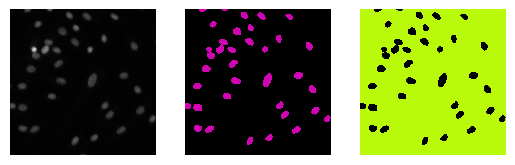

In [23]:
# TODO sample a few images from the dataset and verify that they are correct
for im, mask in train_dataset:
    print(len(train_dataset))
    im = np.transpose(im, (1,2,0))
    fig, ax = plt.subplots(1, 3)
    ax[0].axis("off")
    ax[0].imshow(im, cmap="gray")
    # visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask[0], cmap=get_random_colors(mask), interpolation="nearest")
    ax[2].axis("off")
    ax[2].imshow(mask[1], cmap=get_random_colors(mask), interpolation="nearest")
    
    break

The images you sample should look similar to this (using the standard colormap for the binarized mask):
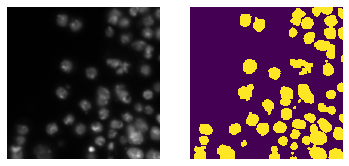

### Implement the U-Net

Next, we will implement a U-Net architecture inspired [Ronneberger et al.](https://arxiv.org/abs/1505.04597), see the image below.

IMPORTANT: unlike in the publication / image we will use SAME convolutions, so that the input shape is the same as the output shape. This will introduce some boundary artifacts, but it will make implementing the rest of this exercise much simpler.
It also means that you don't need to crop the features passed on in the skip connections and can directly concatenate them.

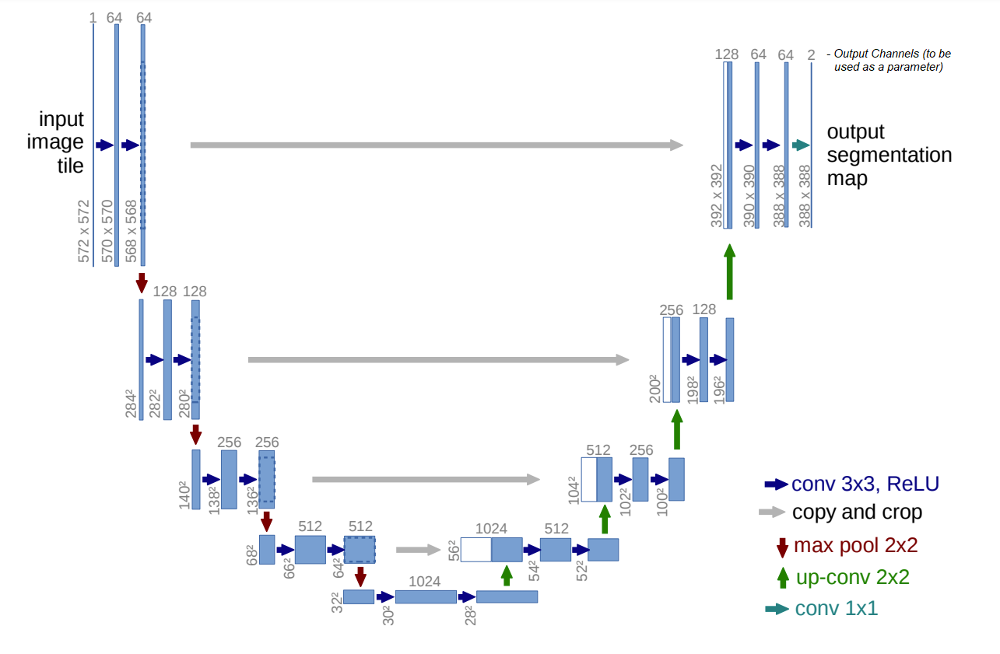

HINTS: 
- the `up-conv` used here is called [ConvTranspose2d](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html#convtranspose2d) in PyTorch.
- you can concatenate the features coming from the skip connections and the encoder with `torch.cat`
- you will need `nn.ModuleList` to store the individual blocks of the encoder / decoder

Before you implement the U-Net, please answer the following QUESTIONS:
- What kind of architecture is the U-Net and what is the rationale behind this architecture?
- What other types of architectures for semantic segmentation exist to achieve similar effects?
- Why are the skip connections used in the U-Net?

**Answers**
* it's an encoder-decoder structure: the shapes get analyzed on one hand, but the spatial relations are preserved through the skip connections
* deeplab -> atrous convolutions and spatial pyramid pooling
* to preserve the spatial relations

In [24]:
# TODO implement the U-Net architecture
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.max_pool = nn.MaxPool2d(2)
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels,64,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(64,64,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(64,128,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(128,128,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(128,256,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(256,256,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(256,512,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(512,512,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.enc5 = nn.Sequential(
            nn.Conv2d(512,1024,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(1024,1024,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.dec1 = nn.Sequential(
            nn.Conv2d(1024,512,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(512,512,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.dec2 = nn.Sequential(
            nn.Conv2d(512,256,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(256,256,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.dec3 = nn.Sequential(
            nn.Conv2d(256,128,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(128,128,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.dec4 = nn.Sequential(
            nn.Conv2d(128,64,kernel_size=3,padding=1),
            nn.ReLU(),
            nn.Conv2d(64,64,kernel_size=3,padding=1),
            nn.ReLU()
        )
        self.conv_transpose1 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.conv_transpose2 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv_transpose3 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv_transpose4 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv_ll = nn.Conv2d(64, self.out_channels,1)
        
    def forward(self, x):
        states = list()
        x = torch.tensor(x, dtype=torch.float)
        x = self.enc1(x)
        states.append(x)
        x = self.enc2(self.max_pool(x))
        states.append(x)
        x = self.enc3(self.max_pool(x))
        states.append(x)
        x = self.enc4(self.max_pool(x))
        states.append(x)
        x = self.enc5(self.max_pool(x))
        states.append(x)
        x = self.dec1(torch.cat((states[3],self.conv_transpose1(x)), dim=1))
        x = self.dec2(torch.cat((states[2],self.conv_transpose2(x)), dim=1))
        x = self.dec3(torch.cat((states[1],self.conv_transpose3(x)), dim=1))
        x = self.dec4(torch.cat((states[0],self.conv_transpose4(x)), dim=1))
        x = self.conv_ll(x)
        return x
            
            
        

In [25]:
# TODO instantiate a unet and check that your architecture is correct by applying it to
# an input from the train loader
model = UNet(out_channels=2)
model.to(device)

UNet(
  (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc1): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
  )
  (enc4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
  )
  (enc5): Sequential(
    (0): Conv2d(512, 1024, kernel_size=(3

In [26]:
# TODO display the prediction. Can you interpret the resulting image?
img = model(torch.tensor(train_dataset[0][0])[None].to(device)).reshape((2,1,256,256))

/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


In [27]:
def imshow(img):
    img = img / 2 + 0.5  # unnormalise
    npimg = img.detach().numpy()
    plt.axis('off')
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

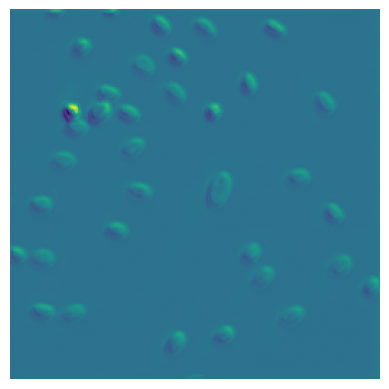

In [28]:
imshow(img[0].cpu())


## Training

Now we can define the training functions, similar to the last exercises but adapted for segmentation, and then plot the results of loss and metrics.

## Discussion:
Another way to monitor the loss, metrics and images during training and validation is [tensorboard](https://www.tensorflow.org/tensorboard). Note that usually the data for tensorboard is stored separately from the notebook files/scripts, so if you copy the scripts somewhere else you will not see the curves in tensorboard anymore.

In [29]:
# in this cell all the training and validation functions are implemented for you already;
# these implementations are fairly similar to the exercise where we trained a CNN on CIFAR

# normalize a tensor to range [0, 1] (per channel).
# This is needed to properly display the tensor as an image in tensorboard
def normalize(tensor):
    eps = 1e-6
    normed = tensor.numpy()
    minval = normed.min(axis=(0, 2, 3), keepdims=True)
    normed = normed - minval
    maxval = normed.max(axis=(0, 2, 3), keepdims=True)
    normed = normed / (maxval + eps)
    return torch.from_numpy(normed)


# train the model for one epoch
def train_epoch(model, loader, loss, metric, optimizer):
    model.train()
    metric_list, loss_list = [], []
    for i, (x, y) in enumerate(loader):
        optimizer.zero_grad()
        x, y = x.to(device), y.to(device)
        pred = model(x)
        loss_value = loss(pred, y)
        loss_value.backward()
        optimizer.step()
        loss_list.append(loss_value.item())
        if metric is not None:
            metric_value = metric(pred, y)
            metric_list.append(metric_value.item())

    if metric is not None:
        return np.mean(loss_list), np.mean(metric_list)
    else:
        return np.mean(loss_list), None


# validate the model
def validate(model, loader, loss, metric):
    model.eval()
    metric_list, loss_list = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x)
            loss_value = loss(pred, y).item()
            loss_list.append(loss_value)
            if metric is not None:
                metric_value = metric(pred, y).item()
                metric_list.append(metric_value)

    if metric is not None:
        return np.mean(loss_list), np.mean(metric_list)
    else:
        return np.mean(loss_list), None


# run the whole training
def run_training(
    model, train_loader, val_loader, loss, metric, optimizer, n_epochs
):
    train_losses, train_accs = [], []
    val_losses, val_accs = [], []
    for epoch in tqdm.trange(n_epochs):
        epoch_train_loss, epoch_train_acc = train_epoch(model, train_loader, loss, metric, optimizer)
        epoch_val_loss, epoch_val_acc = validate(model, val_loader, loss, metric)
        
        print("Train loss:" + str(epoch_train_loss) + " train accc:"
              + str(epoch_train_acc) + "val loss:" + str(epoch_val_loss) + " val accc:" + str(epoch_val_acc))
        
        # save the loss and accuracy for plotting
        train_losses.append(epoch_train_loss)
        train_accs.append(epoch_train_acc)
        val_losses.append(epoch_val_loss)
        val_accs.append(epoch_val_acc)
    
    return train_losses, train_accs, val_losses, val_accs


# plot the metrics
def plot(title, label, train_results, val_results, yscale='linear', save_path=None, 
         extra_pt=None, extra_pt_label=None):
    epoch_array = np.arange(len(train_results)) + 1
    train_label, val_label = "Training " + label.lower(), "Validation " + label.lower()
    
    sns.set(style='ticks')

    plt.plot(epoch_array, train_results, epoch_array, val_results, linestyle='dashed', marker='o')
    legend = ['Train results', 'Validation results']
    
    if extra_pt:
        plt.plot(*extra_pt, 'ok')
    if extra_pt_label:
        legend.append(extra_pt_label)
        
    plt.legend(legend)
    plt.xlabel('Epoch')
    plt.ylabel(label)
    plt.yscale(yscale)
    plt.title(title)
    
    sns.despine(trim=True, offset=5)
    plt.title(title, fontsize=15)
    if save_path:
        plt.savefig(str(save_path), bbox_inches='tight')
    plt.show()

We will use (per-pixel) binary cross entropy as a loss function. Pytorch offers to different implementations of this loss: [BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html) and [BCEWithLogitsLoss](https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html).

HINTS:
- The targets for BCE should be 'float32' values

QUESTIONS:
- What is the difference between the two different implementations?
- Which one do we need to use here, and why?

In [30]:
# TODO implement the dice score as a function.
# HINTS: 
# - for later parts of this exercises, you should implement it in such a way that
# the function can compute the dice score for input and target with multiple channels,
# and so that it is computed independently per channel and the channel average is returned
# - since we don't have an activation in the U-Net you need to bring the predictions in range [0, 1] using torch.sigmoid
# - the dice score can be formulated for continuous predictions in [0, 1]; you do not need to threshold the predictions

def dice_score(input_, target):
    input_1, input_2, target1, target2 = torch.tensor(input_[:,0,:,:]).flatten(), torch.tensor(input_[:,1,:,:]).flatten(), torch.tensor(target[:,0,:,:]).flatten(), torch.tensor(target[:,1,:,:]).flatten()
    
    input_1 = torch.sigmoid(input_1)
    input_2 = torch.sigmoid(input_2)
    out1 = 2*torch.dot(input_1, target1)/(torch.dot(input_1, input_1) + torch.dot(target1, target1))
    out2 = 2*torch.dot(input_2, target2)/(torch.dot(input_2, input_2) + torch.dot(target2, target2))
    if (out1<0 or out2<0):
        print("Negative dice")
        print(str(any(input_1<0)) + " " + str(any(input_2<0)))
        print("i1*t1 = " +str(torch.dot(input_1, target1)))
        print("i2*t2 = " +str(torch.dot(input_2, target2)))
    return (out1 + out2)/2

**Answers**
* the difference is whether the sigmoid is applied on the output values before calculating the loss or not
* BCEWithLogisLoss, because we want to predict fore- or background the bcewithlogitloss suits well

In [31]:
# TODO create the loss function
loss = nn.BCEWithLogitsLoss()

Next, we want to define a suitable metric for measuring the quality of the (binary) network prediction. We will use the [dice score](https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient) for this, which compares the intersection of prediction and target to their union.

In [32]:
# TODO check your dice implementation for an example model prediction and the corresponding target
dice_score(train_dataset[8][1][None], train_dataset[8][1][None])

tensor(0.7266)

  0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
/tmp/ipykernel_47/1491435142.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_1, input_2, target1, target2 = torch.tensor(input_[:,0,:,:]).flatten(), torch.tensor(input_[:,1,:,:]).flatten(), torch.tensor(target[:,0,:,:]).flatten(), torch.tensor(target[:,1,:,:]).flatten()
 10%|█         | 1/10 [00:16<02:25, 16.16s/it]

Train loss:0.8204141815329181 train accc:0.8521080835423661val loss:0.1414678805993627 val accc:0.8751164882079415


 20%|██        | 2/10 [00:31<02:07, 15.90s/it]

Train loss:0.17885927150832084 train accc:0.8862621458774468val loss:0.13695727373756791 val accc:0.8702757954597473


 30%|███       | 3/10 [00:47<01:50, 15.84s/it]

Train loss:0.13755354488637508 train accc:0.9080094875029798val loss:0.11381085415411255 val accc:0.8955765211063883


 40%|████      | 4/10 [01:03<01:34, 15.80s/it]

Train loss:0.18800202991049034 train accc:0.9093070871565702val loss:0.13686721982515376 val accc:0.908726251643637


 50%|█████     | 5/10 [01:19<01:18, 15.78s/it]

Train loss:0.17502985930730333 train accc:0.8730255653554538val loss:0.11590024845107742 val accc:0.8918710273245106


 60%|██████    | 6/10 [01:34<01:03, 15.78s/it]

Train loss:0.11578872633212738 train accc:0.9207456229289748val loss:0.09669519859649565 val accc:0.9209435374840446


 70%|███████   | 7/10 [01:50<00:47, 15.78s/it]

Train loss:0.11732730703847923 train accc:0.923256923005266val loss:0.10035735139947223 val accc:0.9192180814950363


 80%|████████  | 8/10 [02:06<00:31, 15.78s/it]

Train loss:0.11225778075102014 train accc:0.9248281699025406val loss:0.0959767403850413 val accc:0.922732386900031


 90%|█████████ | 9/10 [02:22<00:15, 15.76s/it]

Train loss:16.93358794245254 train accc:0.8500982403957268val loss:0.13991396777007892 val accc:0.8775463233823362


100%|██████████| 10/10 [02:37<00:00, 15.80s/it]

Train loss:0.13076770566140283 train accc:0.9134328332993219val loss:0.12600156243728555 val accc:0.8947292877280194


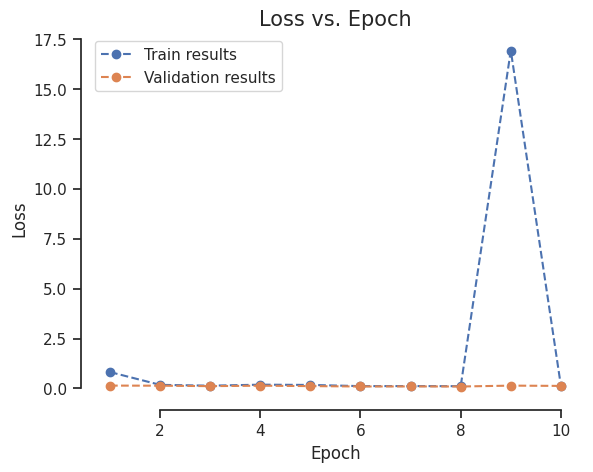

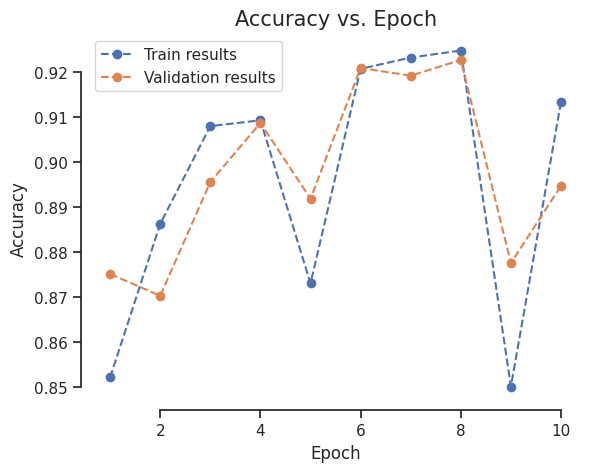

In [33]:
# train the model for 10 epochs, 
# after the training, check the plots to see how the model loss and metrics evolve,
# and to see predictions of the training data in real time
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) 
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = dice_score
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

## Evaluate on test data

Now, we will evaluate the **instance segmentation**  derived from the model predictions on the test data. To this end, we will use [connected components](https://en.wikipedia.org/wiki/Component_(graph_theory)#Algorithms) to convert the (binarized) network predictions into an instance segmentation. We will use the implementation from [skimage](https://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.label).

**QUESTION**:
- Describe briefly what the connected components algorithm does when applied to a (binary) image. (You don't need to comment on the implementation).

**Answers**
* the algorithm takes the binary input as a graph where each pixel is a vertex and each neighbor is a connection. then it applies the connected components algorithm. starting with the first vertex it looks for all neighbors of it and then iteratively looks for their neighbors, until there are no untouched connected neighbors. all these vertices belong to one connected component. then the next vertex not in this component is taken and the algorithm is repeated until all vertices are classified

In [34]:
#test images and mask defined at top

/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


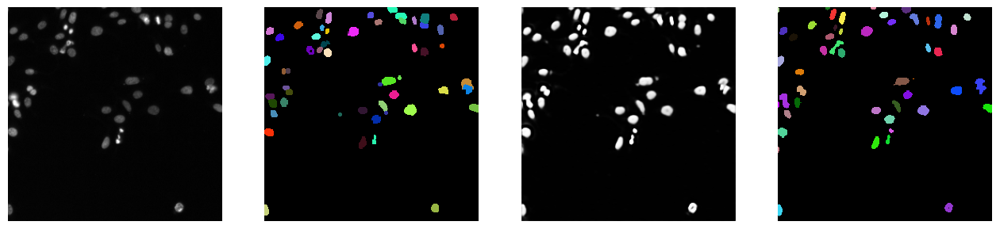

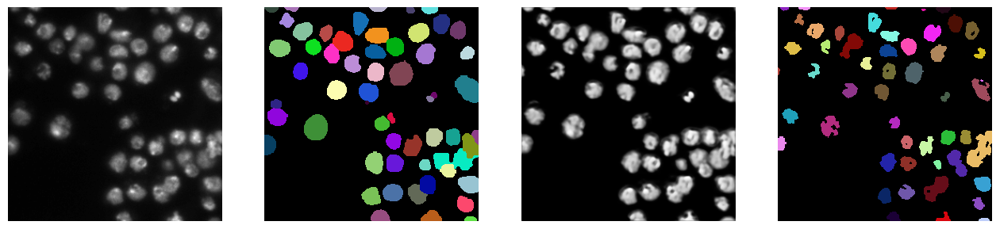

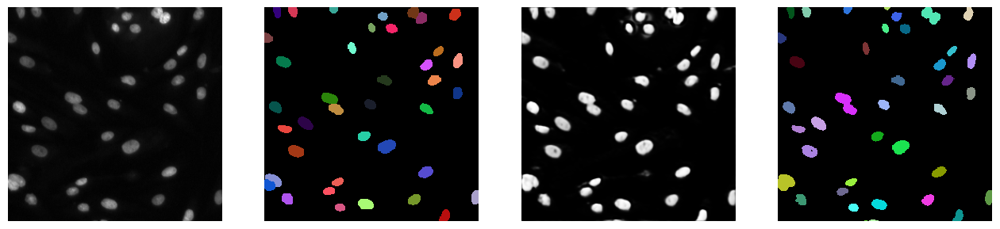

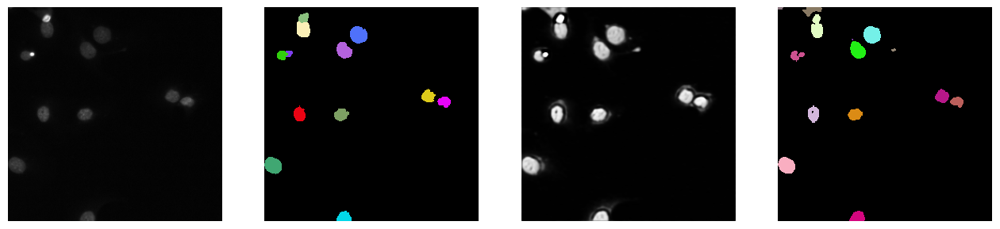

In [35]:
# check out instance segmentation for a few test images
counter = 0
with torch.no_grad():
    for im, mask in zip(test_images, test_masks):
        if counter > 3:
            break
        # predict with the model and apply sigmoid to map the prediction to the range [0, 1]
        pred = model(torch.from_numpy(im[None, None]).to(device))
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()
        # get tbe nucleus instance segmentation by applying connected components to the binarized prediction
        nuclei = label(pred[0] > 0.5)
        fig, ax = plt.subplots(1, 4, figsize=(16, 16))
        ax[0].axis("off")
        ax[0].imshow(im, cmap="gray")
        ax[1].axis("off")
        ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
        ax[2].axis("off")
        ax[2].imshow(pred[0], cmap="gray")
        ax[3].axis("off")
        ax[3].imshow(nuclei, cmap=get_random_colors(nuclei), interpolation="nearest")
        plt.show()
        counter += 1

To measure the segmentation quality we compute the intersection over union of each object in the prediction and each object in the ground-truth (if they overlap at all). We then find the best match between ground-truth and predicted objects and count all best matches above a given threshold (here 0.5) as true positives (TP). The objects in the the ground-truth that do not have a match are counted as false negatives (FN), the objects in the prediction that do not have a match as false positives (FP).

We can then compute the F1-Score based on TP, FP and FN and use it as evaluation criterion to compare the quality of instance segmentation results.

In [36]:
# compute f1 score based on true positives, false positives and false negatives
def f1(tp, fp, fn):
    return (2*tp)/(2*tp+fp+fn) if tp > 0 else 0


# compute the matches between predicted object (seg) and ground-truth objects (mask)
def compute_scores(seg, mask):
    # the contingency table function computes the overlap (intersection) between all objects in the two segmentations 
    overlap = contingency_table(seg, mask).toarray()
    # compute the total number of pixels for each object
    n_pixels_pred = np.sum(overlap, axis=0, keepdims=True)
    n_pixels_true = np.sum(overlap, axis=1, keepdims=True)
    # normalize the overlap by the union to compute the IOU
    eps = 1e-7
    ious = overlap / np.maximum(n_pixels_pred + n_pixels_true - overlap, eps)
    # ignore matches with zero (= background)
    ious = ious[1:, 1:]
    # compute the number of true objects (in mask), predicted object (in seg)
    # and the maximal number of matches (minimum of the too)
    n_pred, n_true = ious.shape
    n_matched = min(n_pred, n_true)
    return n_true, n_matched, n_pred, ious


# compute the true positives (= matches with a iou bigger than the threshold)
def compute_tps(ious, n_matched, threshold):
    not_trivial = n_matched > 0 and np.any(ious >= threshold)
    if not_trivial:
        # compute optimal matching with iou scores as tie-breaker
        costs = -(ious >= threshold).astype(float) - ious / (2*n_matched)
        pred_ind, true_ind = linear_sum_assignment(costs)
        assert n_matched == len(true_ind) == len(pred_ind)
        match_ok = ious[pred_ind, true_ind] >= threshold
        tp = np.count_nonzero(match_ok)
    else:
        tp = 0
    return tp


# compute the f1 score between predicted (seg) and ground-truth (mask) objects for the given threshold
def f1_score(seg, mask, threshold=0.5):
    if seg.sum() == 0:
        return 0.0
    n_true, n_matched, n_pred, scores = compute_scores(seg, mask)
    tp = compute_tps(scores, n_matched, threshold)
    fp = n_pred - tp
    fn = n_true - tp
    return f1(tp, fp, fn)

In [37]:
# Compute the average f1 score of all the test images
f1s = []
model.eval()
with torch.no_grad():
    for im, mask in tqdm.tqdm(zip(test_images, test_masks), total=len(test_images)):
        # the model can only predict images with a spatial size that is divisible by 16
        # if it isn't we just cat a few pixels to make it fit
        if any(sh % 16 != 0 for sh in im.shape):
            crop = tuple(
                slice(0, -(sh%16)) for sh in im.shape
            )
            im = im[crop]
            mask = mask[crop]
        input_ = torch.from_numpy(im[None, None]).to(device)
        pred = model(input_)
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()
        labels = label(pred[0] > 0.5)

        f1s.append(f1_score(labels, mask))
print()
# print(f1s)
print("Mean f1 score:", np.mean(f1s))

  0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
100%|██████████| 50/50 [00:01<00:00, 32.33it/s]


Mean f1 score: 0.6068094398618876


**QUESTION**:
- Based on the examples you have visualized above, what are the biggest sources of error in the model predictions (instance segmentation)?
- How could these errors be addressed?

**Answers**
* there are streaks next to cells which often lead to misclassification
* one could search for boundaries and make them hard and not soft, or we could learn the boundaries between nuclei and split the regions that way

## Train with boundary channel

To avoid merges of touching nuclei, we will now add a boundary channel to the learning objective, and then use it for object separation in the instance segmentation funtion. To this end, we will train a U-Net that outputs 3 channels (background, foreground, object boundary) and use the cross entropy loss.

In [38]:
# TODO implement a transform that outputs an image with 3 values:
# 0 for backgorund, 1 for foreground (= nucleus) and 2 for boundary (boundary pixel between nucleus and background or between 2 nuclei)
# HINT: you can use skimage.segmentation.find_boundaries (already imported) to determine the boundary pixels
# DAS HIER IST EINE FURCHTBARE BESCHREIBUNG

def label_transform(mask):
    fg = np.where(mask != 0, 1, 0)
    bg = np.where(mask == 0, 1, 0)
    
    new_mask = find_boundaries(mask, mode='inner')

    return bg.astype(np.float32), fg.astype(np.float32), new_mask.astype(np.float32)

In [39]:
# instantiate the training and validation datasets with the new label transform
train_dataset = NucleiDataset(
    train_images, train_masks, mask_transform=label_transform
)
val_dataset = NucleiDataset(
    val_images, val_masks, mask_transform=label_transform
)

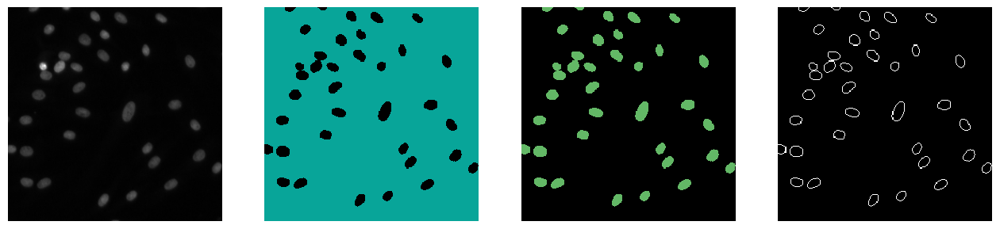

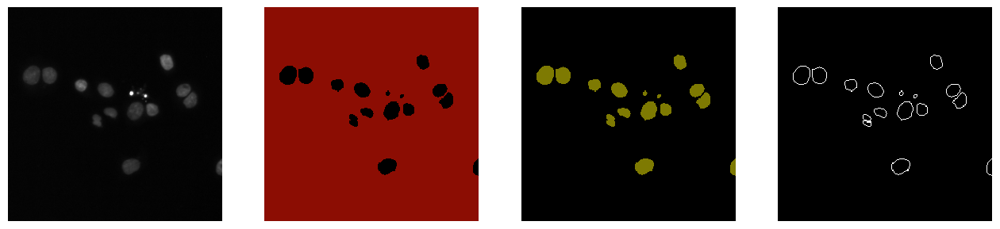

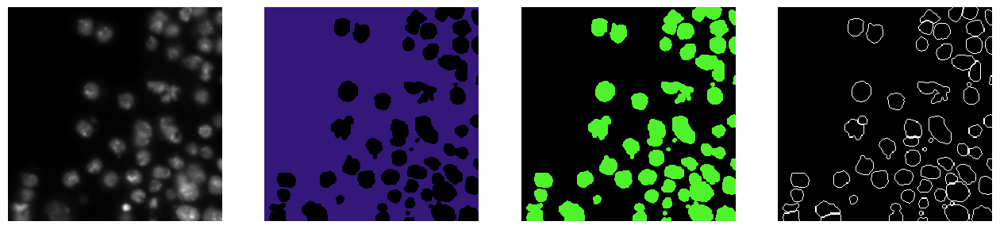

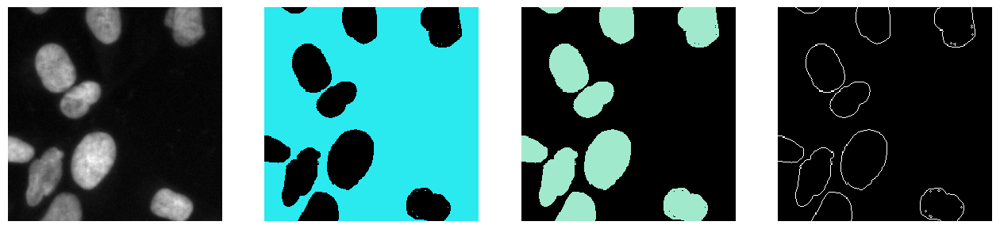

In [40]:
# visualize the new label transform and make sure it's correct
counter = 0
for im, target in train_dataset:
    if counter > 3:
        break
    fig, ax = plt.subplots(1, 4, figsize=(16, 16))
    ax[0].axis("off")
    ax[0].imshow(im[0], cmap="gray")
    
    ax[1].axis("off")
    ax[1].imshow(target[0], cmap=get_random_colors(target[0]), interpolation="nearest")
    
    ax[2].axis("off")
    ax[2].imshow(target[1], cmap=get_random_colors(target[1]), interpolation="nearest")
    
    ax[3].axis("off")
    ax[3].imshow(target[2], cmap="gray", interpolation="nearest")
    plt.show()
    counter += 1

In [41]:
def dice_loss(input_, target):
    return 1 - dice_score(input_, target)

In [42]:
class CustomCombinedLoss(nn.Module):
    def __init__(self, bce_weight=1.0, dice_weight=1.0):
        super(CustomCombinedLoss, self).__init__()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.bce_loss = nn.BCEWithLogitsLoss()
        self.dice_loss = dice_loss

    def forward(self, input_, target):
        # Calculate BCE loss
        bce_loss = self.bce_loss(input_, target)
        
        # Calculate Dice loss
        dice_loss = self.dice_loss(input_, target)

        # Combine the losses
        combined_loss = self.bce_weight * bce_loss + self.dice_weight * dice_loss

        return combined_loss

  0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
 10%|█         | 1/10 [00:16<02:27, 16.34s/it]

Train loss:0.19275275215875567 train accc:Noneval loss:0.11862271084733632 val accc:None


 20%|██        | 2/10 [00:32<02:10, 16.35s/it]

Train loss:0.11351232278808174 train accc:Noneval loss:0.12013582873117665 val accc:None


 30%|███       | 3/10 [00:49<01:54, 16.35s/it]

Train loss:0.09290744535150533 train accc:Noneval loss:0.07283500752047352 val accc:None


 40%|████      | 4/10 [01:05<01:38, 16.34s/it]

Train loss:0.07400772573079316 train accc:Noneval loss:0.05244887375232318 val accc:None


 50%|█████     | 5/10 [01:21<01:21, 16.32s/it]

Train loss:0.06158673504690358 train accc:Noneval loss:0.04647014877232521 val accc:None


 60%|██████    | 6/10 [01:38<01:05, 16.33s/it]

Train loss:0.05914683577182861 train accc:Noneval loss:0.04587350273504853 val accc:None


 70%|███████   | 7/10 [01:54<00:49, 16.34s/it]

Train loss:0.05708751190159435 train accc:Noneval loss:0.04782558908767026 val accc:None


 80%|████████  | 8/10 [02:10<00:32, 16.34s/it]

Train loss:0.05735561559042665 train accc:Noneval loss:0.06726422577934421 val accc:None


 90%|█████████ | 9/10 [02:27<00:16, 16.33s/it]

Train loss:0.06111964177810324 train accc:Noneval loss:0.04412285509802725 val accc:None


100%|██████████| 10/10 [02:43<00:00, 16.34s/it]

Train loss:0.053964208634702034 train accc:Noneval loss:0.042462636635679264 val accc:None


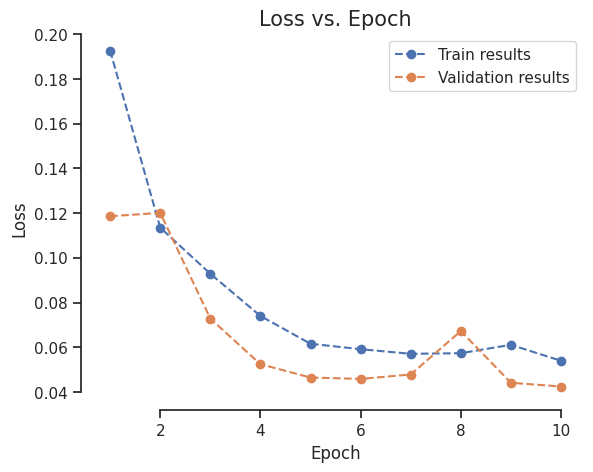

In [43]:
# train the new U-Net for 10 epochs
# (we don't use a metric here, since the target (with class labels 0, 1, 2) and prediction (one-hot encoding) have different representations
# TODO instantiate the new unet and loss function
model = UNet(out_channels=3)
loss = nn.BCEWithLogitsLoss()    #CustomCombinedLoss()
model.to(device)

n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) 
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
metric = None
train_losses, _, val_losses, _ = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)

**Instance segmentation via watershed:**

We now want to use the predictions for background, foreground and boundary to better separate the nuclei than before using the following approach:
- Subtract the boundary prediction from the foreground prediction to separate touching nuclei from each other.
- Apply connected components to the result to get the "core" of the now separated nuclei.
- Grow these nucleus cores back to the full outlines.
    - For this step we will use the watershed algorithm, which segments images based on a height-map and markers.
    - The markers define the core of regions and they are grown by this algorithm until two markers meet at the highest point between them (defined by the heightmap).
- We will restrict the watershed to the foreground, so that nuclei don't spill over into the background. 

**Let's visualize these steps to better understand them:**

- We are given the foreground and boundary predictions from the model:

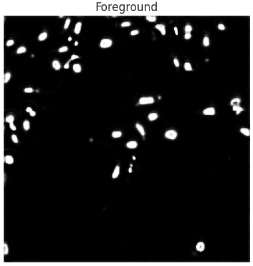 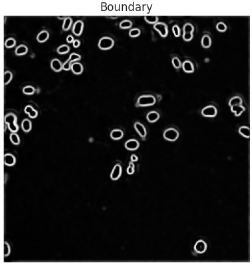

- Subtract the boundaries from the foreground predictions (left image), threshold the result (not shown) and apply connected components to generate the markers (right image):

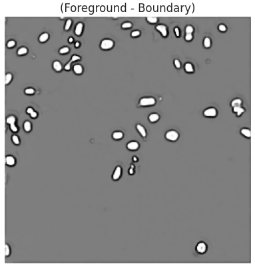 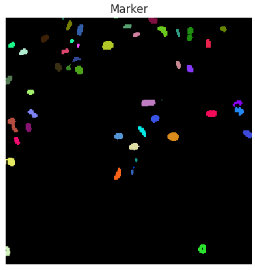

- This provides us with all three inputs for the watershed:
    - The boundary predictions from the network can be used as heightmap (because they separate the nuclei). (left image)
    - The markers that we have just computed (middle image)
    - The thresholded foreground predictions, which we use as mask for the watershed. (right image)

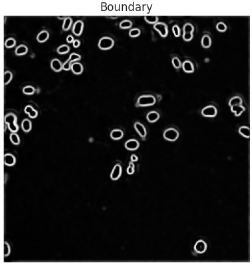 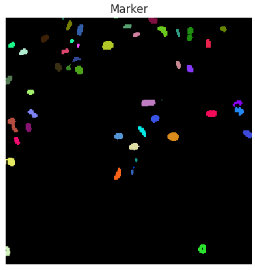 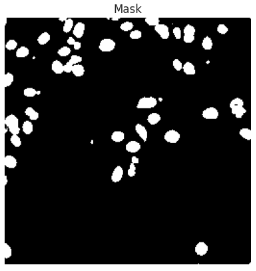


**Implementing the watershed:**

You can use `skimage.segmentation.watershed` (already imported) for this.

Here's how to use it:
```python
from skimage.segmentation import watershed

```

In [44]:
# TODO implement the watershed approach described above.
def instance_segmentation(foreground_prediction, boundary_prediction, threshold=0.5):
    boundaries = boundary_prediction
    markers = label( ( foreground_prediction - boundary_prediction) > threshold )
    mask = foreground_prediction

    segmentation = watershed(image=boundaries, markers=markers, mask=mask)
    return markers

In [ ]:
# TODO check the prediction results and instance segmentation for a few images
# make sure your instance segmentation implementation is correct
# HINT: you need to apply a softmax to the network predictions 
sm = nn.Softmax(dim=0)

counter = 0
with torch.no_grad():
    for im, mask in zip(test_images, test_masks):
        if counter > 5:
            break
        
        pred = model(torch.from_numpy(im[None, None]).to(device))[0].cpu()
        
        for x in range(0,len(pred[0])):
            arr = np.array( [ pred[0][0][x], pred[0][1][x], pred[0][2][x] ] )
            t = torch.from_numpy(arr)
            t = sm(t)
            
            pred[0][0][x] = t[0]
            pred[0][1][x] = t[1]
            pred[0][2][x] = t[2]
            
        pred = torch.Sigmoid(pred, dim=2).cpu().numpy().squeeze()
        seg = instance_segmentation(pred[1], pred[2], 0.01)
        
        # pred = FG, BG, Borders
        fig, ax = plt.subplots(1, 5, figsize=(16, 16))
        
        ax[0].axis("off")
        ax[0].imshow(im, cmap="gray")
        ax[1].axis("off")
        ax[1].imshow(pred[0], cmap="gray")
        ax[2].axis("off")
        ax[2].imshow(pred[1], cmap="gray")
        ax[3].axis("off")
        ax[3].imshow(pred[2], cmap="gray")
        ax[4].axis("off")
        ax[4].imshow(seg, cmap=get_random_colors(seg), interpolation="nearest")
        plt.show()
        counter += 1

In [46]:
def bs(bs):
    # TODO use the validation set to find a good value for the 'threshold' parameter in the instance_segmentation function
    best_threshold = bs
    # Compute the average f1 score of all the test images
    f1s = []
    model.eval()
    with torch.no_grad():
        for im, mask in tqdm.tqdm(zip(test_images, test_masks), total=len(test_images)):
            # 
            if any(sh % 16 != 0 for sh in im.shape):
                crop = tuple(
                    slice(0, -(sh%16)) for sh in im.shape
                )
                im = im[crop]
                mask = mask[crop]

            input_ = torch.from_numpy(im[None, None]).to(device)
            pred = model(input_)
            pred = torch.softmax(pred, dim=1).cpu().numpy().squeeze()
            assert pred.shape[0] == 3
            nuclei = instance_segmentation(pred[1], pred[2])

            f1s.append(f1_score(nuclei, mask, best_threshold))
    print()
    print(np.mean(f1s))
    
for x in range(0,10):
    bs(x/100.0)
    print(x/100.0)

  0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
100%|██████████| 50/50 [00:04<00:00, 10.40it/s]



0.9191270916428048
0.0


100%|██████████| 50/50 [00:04<00:00, 10.44it/s]



0.8768842887839177
0.01


100%|██████████| 50/50 [00:04<00:00, 10.36it/s]



0.875980305127125
0.02


100%|██████████| 50/50 [00:04<00:00, 10.56it/s]



0.875980305127125
0.03


100%|██████████| 50/50 [00:04<00:00, 10.36it/s]



0.875980305127125
0.04


100%|██████████| 50/50 [00:04<00:00, 10.62it/s]



0.875980305127125
0.05


100%|██████████| 50/50 [00:04<00:00, 10.47it/s]



0.8750861992330191
0.06


100%|██████████| 50/50 [00:04<00:00, 10.47it/s]



0.8750861992330191
0.07


100%|██████████| 50/50 [00:04<00:00, 10.54it/s]



0.8750861992330191
0.08


100%|██████████| 50/50 [00:04<00:00, 10.57it/s]


0.8723669009874051
0.09


**QUESTIONS**:
- Did training with the boundaries and using them in the instance segmentation improve the results?
- Can you think of ways to improve the loss function for this learning task?

* It didn't improve the score but it segmented nuclei that are close to each other better
* Bigger dataset, Another output channel, bigger borders ...

## Use the dice coefficient as loss function

Since our target is quite unbalanced (in particular the boundary channel), it is beneficial to use a loss function that is robust against class imbalance. In this part of the exercise we will use the Dice coefficient as loss. We have already used it as a metric before.

Note that we do not need to predict a channel for background when using the dice coefficient as a loss (unlike with Cross Entropy).

In [47]:
def my_loss(inputs, targets):
    inputs = F.sigmoid(inputs)       

    inputs = inputs.view(-1)
    targets = targets.view(-1)

    intersection = (inputs * targets).sum()                            
    dice = (2.*intersection)/(inputs.sum() + targets.sum())  

    return dice

  0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
 10%|█         | 1/10 [00:16<02:27, 16.33s/it]

Train loss:0.0420985834306229 train accc:Noneval loss:0.01591585671691143 val accc:None


 20%|██        | 2/10 [00:32<02:10, 16.35s/it]

Train loss:0.01915415143045017 train accc:Noneval loss:0.016307783171372568 val accc:None


 30%|███       | 3/10 [00:49<01:54, 16.36s/it]

Train loss:0.01902773070345712 train accc:Noneval loss:0.016076083254554997 val accc:None


 40%|████      | 4/10 [01:05<01:38, 16.36s/it]

Train loss:0.019181674819127744 train accc:Noneval loss:0.016024375516597345 val accc:None


 50%|█████     | 5/10 [01:21<01:21, 16.37s/it]

Train loss:0.01898414149214865 train accc:Noneval loss:0.015875974809244763 val accc:None


 60%|██████    | 6/10 [01:38<01:05, 16.36s/it]

Train loss:0.019174042504054564 train accc:Noneval loss:0.016073542404110016 val accc:None


 70%|███████   | 7/10 [01:54<00:49, 16.36s/it]

Train loss:0.019091225477547234 train accc:Noneval loss:0.0160408152429306 val accc:None


 80%|████████  | 8/10 [02:10<00:32, 16.37s/it]

Train loss:0.01912333003991011 train accc:Noneval loss:0.015531779881870456 val accc:None


 90%|█████████ | 9/10 [02:27<00:16, 16.37s/it]

Train loss:0.019093112327610934 train accc:Noneval loss:0.016219033657208733 val accc:None


100%|██████████| 10/10 [02:43<00:00, 16.36s/it]

Train loss:0.018991452939138433 train accc:Noneval loss:0.015971567299540922 val accc:None


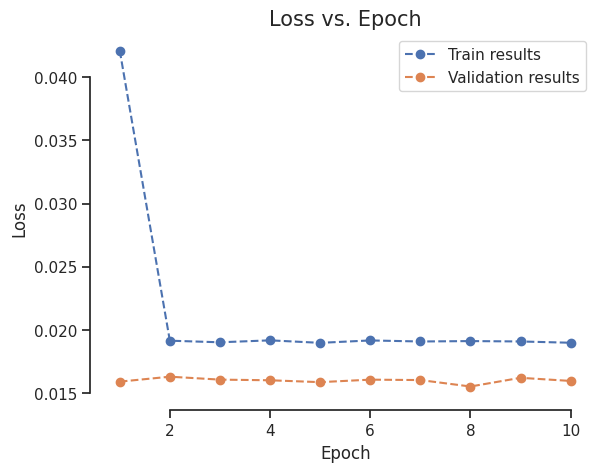

In [48]:
# TODO implement a loss function based on the dice coefficient
# HINT: the dice coefficient is in range [0, 1] and higher values correspond to a better result
# Loss functions are minimized, so lower values should correspond to a better result

model = UNet(out_channels=3)
loss = my_loss
model.to(device)

n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) 
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
metric = None
train_losses, _, val_losses, _ = run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)

In [49]:
# TODO implement and compare with different loss function variations

**QUESTIONS**:
- Did training with dice loss improve the results? Comment on it!

* It significantly decreased the loss of the training

## [Optional] Try variations of the UNet architecture

- add BatchNorm
- replace TransposedConvs with bilinear upsampling and 1x1 convs
- use residual blocks instead of the normal convolutional blocks

In [50]:
# TODO implement and compare u-net architecture variations

## [Optional] Train with data augmentation

- rotations & flips
- noise augmentations (add gaussian noise and/or poisson noise)
- crop and resize

Hint: use the `image_transform` (noise augmentations) and `transform` (geometrical augmentations) argument of the `NucleiDataset`

In [51]:
# TODO implement data augmentations and compare with training without augmentations

# Denoising with Noise2Noise

Here, we implement [Noise2Noise](https://arxiv.org/abs/1803.04189), which is a method to learn image denoising **without** ground-truth, by using a different noisy image as target. Note that we are re-using the same architecture as before, which is a bit different from the one used in the paper.

## Data Preparation

We use the [VSDR dataset](https://cv.snu.ac.kr/research/VDSR), which contains 'clean' (i.e. without noise) natural images.

In [52]:
# download the VSDR data
!conda install -y gdown
!gdown --id 1hNB5_MkxutrKLa1g35tSLCiq1J5xxH9F --folder

os.makedirs("/kaggle/working/dlforcv-ex4", exist_ok=True)

!unzip "/kaggle/working/VDSR/train_data.zip" -d "dlforcv-ex4/vsdr_train"
!unzip "/kaggle/working/VDSR/test_data.zip" -d "dlforcv-ex4/vsdr_test"

Retrieving notices: ...working... done
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.7.4
  latest version: 23.11.0

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.11.0



## Package Plan ##

  environment location: /opt/conda

  added / updated specs:
    - gdown


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2023.11.17 |       hbcca054_0         151 KB  conda-forge
    certifi-2023.11.17         |     pyhd8ed1ab_0         155 KB  conda-forge
    filelock-3.13.1            |     pyhd8ed1ab_0          15 KB  conda-forge
    gdown-4.7.1                |     pyhd8ed1ab_0          19 KB  conda-forge
    openssl-3.2.0              |       hd590300_1         2.7 MB  conda-forge
    ---------

In [53]:
# setting paths for the training and testing data
vsdr_train = "/kaggle/working/dlforcv-ex4/vsdr_train/"
vsdr_test = "/kaggle/working/dlforcv-ex4/vsdr_test/"

In [54]:
# check the unique image sizes in the training data
image_exts = (".jpeg", ".jpg", ".png", ".bmp")
all_image_paths = [
    p for p in Path(vsdr_test).glob("**/*") if p.suffix.lower() in image_exts
]
shapes = []
for p in all_image_paths:
    shapes.append(imageio.imread(p).shape)
unique_shapes = list(set(shapes))
print(unique_shapes)

[(672, 1024, 3), (768, 1024, 3), (980, 1000, 3), (656, 529, 3), (681, 1024, 3), (819, 1024, 3), (656, 1024, 3), (1024, 768, 3), (481, 321, 3), (769, 1024, 3), (344, 228, 3), (683, 1024, 3), (805, 1024, 3), (695, 1024, 3), (673, 1024, 3), (827, 1200, 3), (512, 512), (362, 500, 3), (1200, 798, 3), (512, 768, 3), (1024, 1005, 3), (680, 1024, 3), (963, 1280, 3), (288, 352, 3), (1024, 567, 3), (766, 1024, 3), (732, 1024, 3), (682, 1024, 3), (1037, 778, 3), (692, 1024, 3), (676, 1024, 3), (727, 1024, 3), (276, 276, 3), (288, 288, 3), (864, 1024, 3), (835, 1024, 3), (694, 1024, 3), (512, 512, 3), (280, 280, 3), (616, 1024, 3), (576, 1024, 3), (1024, 692, 3), (1024, 1024, 3), (678, 1024, 3), (1024, 685, 3), (644, 1024, 3), (1024, 683, 3), (773, 1024, 3), (797, 1024, 3), (256, 256, 3), (689, 1024, 3), (765, 1024, 3), (480, 500, 3), (391, 586, 3), (737, 1024, 3), (1024, 742, 3), (321, 481, 3), (660, 1024, 3), (576, 720, 3), (1024, 700, 3), (665, 1024, 3), (575, 1024, 3), (361, 250, 3)]


In [55]:
# vsdr dataset that can deal with all the different data sizes in the training and test data
class VsdrDataset(Dataset):
    def __init__(self, root_dir, noise_transform):
        image_exts = (".jpeg", ".jpg", ".png", ".bmp")
        self.image_paths = [
            p for p in Path(root_dir).glob("**/*") if p.suffix.lower() in image_exts
        ]
        self.noise_transform = noise_transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        im = np.array(imageio.imread(self.image_paths[index]))
        if im.ndim == 2:
            im = np.concatenate([im[..., None]] * 3, axis=2)
        if im.shape[-1] == 1:
            im = np.concatenate([im] * 3, axis=2)
        target_shape = (256, 256)
        # first, pad the images if they are smaller than the target crop shape
        if any(sh < tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            padding = tuple((0, tsh - sh if sh < tsh else 0) for sh, tsh in zip(im.shape[:-1], target_shape))
            padding = padding + ((0, 0),)
            im = np.pad(im, padding, mode="reflect")
        # then crop tham if they are too large
        if any(sh > tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            crop_start = [np.random.randint(0, sh - tsh) if sh != tsh else 0 for sh, tsh in zip(im.shape[:-1], target_shape)]
            crop = tuple(slice(cs, cs + tsh) for cs, tsh in zip(crop_start, target_shape))
            im = im[crop]
        assert im.shape == (256, 256, 3), f"{im.shape}"
        
        # normalize the image to range [0, 1] (per channel)
        im = im.astype("float32")
        im -= im.min(axis=(0, 1), keepdims=True)
        im /= im.max(axis=(0, 1), keepdims=True)
        # bring image in range [-1, 1]
        im = 2 * im - 1
        
        # transform to channel first order
        im = im.transpose((2, 0, 1))
        # apply the noise transformation
        return self.noise_transform(im)

In [56]:
# go from range [-1, 1] to [0, 255] and uint 8
# and go to channel last order
def to_display(im):
    im = (((im + 1) / 2) * 255).astype("uint8")
    return im.transpose((1, 2, 0))

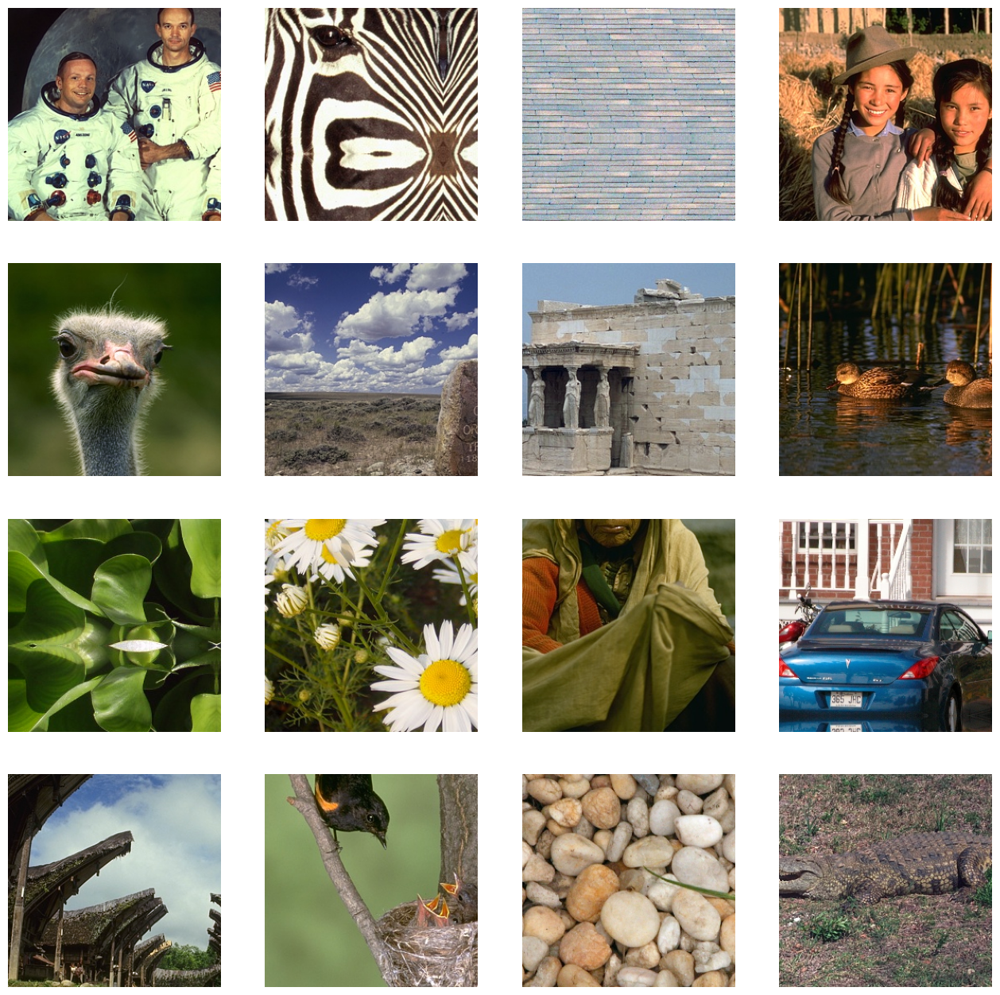

In [57]:
# sample a few images
check_dataset = VsdrDataset(vsdr_train, lambda x: x)
fig, ax = plt.subplots(4, 4, figsize=(16, 16))
for ii in range(16):
    im = check_dataset[ii]
    ax[ii % 4, ii // 4].axis("off")
    ax[ii % 4, ii // 4].imshow(to_display(im))
plt.show()

## Train a network with clean targets

As the first baseline, we will train a network with clean target data (i.e. without noise added to it). 

In [58]:
# instatiate the model and loss function (Mean Squared Error)
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [59]:
# we will use the PSNR (peak signal to noise ratio) as metric to evaluate the predictions.
# you can read up on it and the implementation we are using here:
# https://www.ni.com/en-us/innovations/white-papers/11/peak-signal-to-noise-ratio-as-an-image-quality-metric.html
# (the higher the PSNR, the better)

def to_uint8(im):
    return torch.clamp((im + 0.5) * 255.0 + 0.5, 0, 255).type(torch.uint8)


class PSNR(nn.Module):
    def __call__(self, x, y):
        x, y = to_uint8(x), to_uint8(y)
        x, y = x.detach().cpu().numpy(), y.detach().cpu().numpy()
        return peak_signal_noise_ratio(x, y)

**QUESTION**:
- What does the PSNR metric measure?
- Why is it used instead of 'just' computing the pixel wise error (MSE)?

**Answers**
* PSNR measures the log ratio of the maximum pixel values to the MSE (MAX is the highest possible value while MSE measures the mean L2 norm of noisefree and noisy picture)
* psnr also takes the dynamic range into account and therefore leads to better comparability within different picture formats

In [60]:
# TODO implement a function that adds additive gaussian noise to the input
# the var argument should correspond to the variance of the gaussian
# HINT: you can use the function `random_noise` from scikit-image.
def additive_gaussian_noise(x, var=0.1):
    return random_noise(x, mode='gaussian', var=var)

In [61]:
vsdr_gaussian = VsdrDataset(vsdr_train, additive_gaussian_noise)
vsdr_original = VsdrDataset(vsdr_train, lambda x: x)

In [62]:
class CustomDataset(Dataset):
    def __init__(self, input_dataset, target_dataset):
        self.input_dataset = input_dataset
        self.target_dataset = target_dataset

    def __len__(self):
        # Return the length of either input or target dataset (assuming they have the same length)
        return len(self.input_dataset)

    def __getitem__(self, idx):
        # Get the input and target images for the given index
        #input_image = self.input_dataset[idx]
        #target_image =self.target_dataset[idx]
        input_image = torch.tensor(self.input_dataset[idx], dtype=torch.float)
        target_image = torch.tensor(self.target_dataset[idx], dtype=torch.float)

        # Return a dictionary with input and target images
        return [input_image,target_image]

In [63]:
# TODO instantiate a vsdr dataset corresponding to the vsdr_train folder 
# with a noise transformation that returns a corrupted image (as network input)
# and a clean image (as target)
# use a variance of 0.1
# split the dataset into a train (90% of the data) and validation dataset (10%)
# HINT: you can use torch.utils.data.random_split to split a torch dataset
noise_dataset = CustomDataset(vsdr_gaussian, vsdr_original)
generator1 = torch.Generator().manual_seed(42)

vsdr_train_ds, vsdr_val_ds = torch.utils.data.random_split(noise_dataset, [.9, .1], generator=generator1)

In [64]:
#model(torch.tensor(vsdr_train_ds[0][0], dtype=torch.float).reshape((1,3,256,256)).to(device))
model(torch.tensor(vsdr_train_ds[0][0], dtype=torch.float).reshape((1,3,256,256)).to(device))

/tmp/ipykernel_47/2162084097.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  model(torch.tensor(vsdr_train_ds[0][0], dtype=torch.float).reshape((1,3,256,256)).to(device))
/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


tensor([[[[0.0858, 0.0875, 0.0858,  ..., 0.0852, 0.0860, 0.0900],
          [0.0875, 0.0853, 0.0842,  ..., 0.0862, 0.0848, 0.0866],
          [0.0890, 0.0874, 0.0864,  ..., 0.0896, 0.0882, 0.0869],
          ...,
          [0.0909, 0.0884, 0.0912,  ..., 0.0909, 0.0907, 0.0878],
          [0.0861, 0.0865, 0.0858,  ..., 0.0850, 0.0862, 0.0861],
          [0.0891, 0.0879, 0.0891,  ..., 0.0896, 0.0903, 0.0865]],

         [[0.1194, 0.1228, 0.1206,  ..., 0.1244, 0.1222, 0.1238],
          [0.1177, 0.1240, 0.1177,  ..., 0.1214, 0.1260, 0.1255],
          [0.1176, 0.1227, 0.1179,  ..., 0.1236, 0.1271, 0.1267],
          ...,
          [0.1131, 0.1207, 0.1191,  ..., 0.1215, 0.1248, 0.1196],
          [0.1131, 0.1172, 0.1148,  ..., 0.1146, 0.1198, 0.1194],
          [0.1152, 0.1185, 0.1167,  ..., 0.1172, 0.1199, 0.1180]],

         [[0.0429, 0.0407, 0.0428,  ..., 0.0373, 0.0367, 0.0373],
          [0.0485, 0.0482, 0.0515,  ..., 0.0488, 0.0430, 0.0381],
          [0.0467, 0.0497, 0.0471,  ..., 0

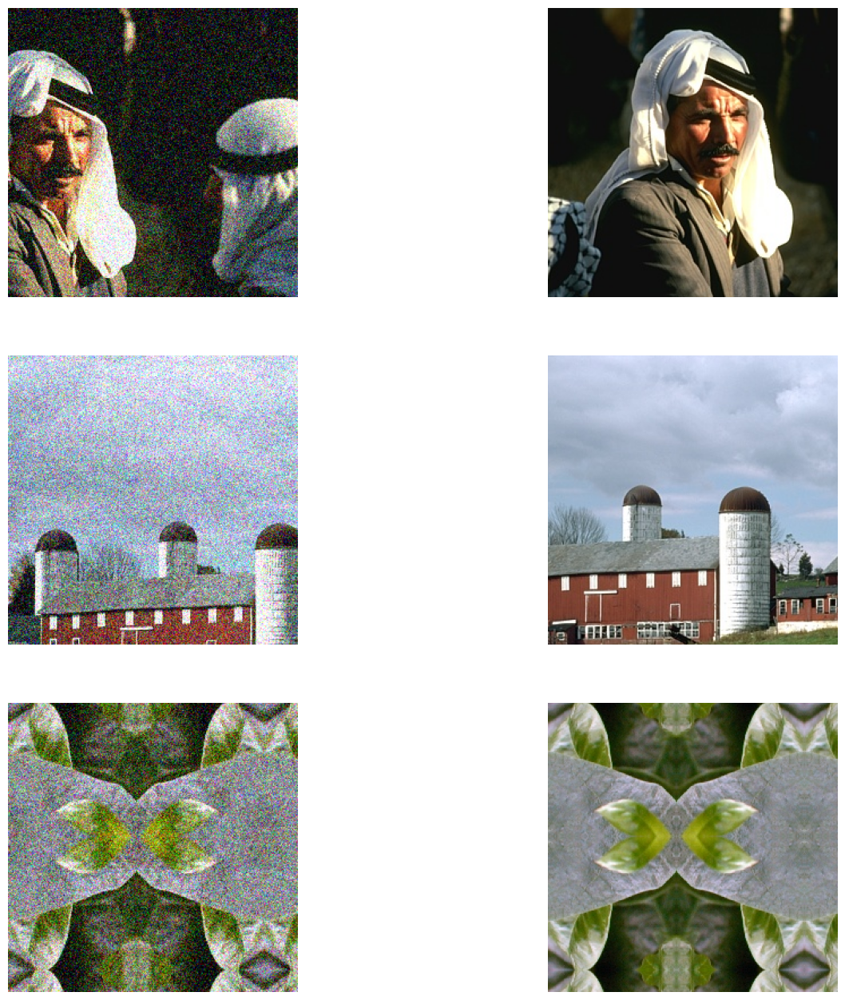

In [65]:
# sample a few images from the train dataset
fig, ax = plt.subplots(3, 2, figsize=(16, 16))
for ii in range(3):
    noisy, clean = vsdr_train_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(np.array(noisy)))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(np.array(clean)))
plt.show()

In [66]:
# TODO implement the dice score as a function.
# HINTS: 
# - for later parts of this exercises, you should implement it in such a way that
# the function can compute the dice score for input and target with multiple channels,
# and so that it is computed independently per channel and the channel average is returned
# - since we don't have an activation in the U-Net you need to bring the predictions in range [0, 1] using torch.sigmoid
# - the dice score can be formulated for continuous predictions in [0, 1]; you do not need to threshold the predictions

def dice_score(input_, target):
    input_1, input_2, target1, target2 = torch.tensor(input_[:,0,:,:]).flatten(), torch.tensor(input_[:,1,:,:]).flatten(), torch.tensor(target[:,0,:,:]).flatten(), torch.tensor(target[:,1,:,:]).flatten()
    
    input_1, input_2, target1, target2 = torch.sigmoid(input_1),torch.sigmoid(input_2), torch.sigmoid(target1), torch.sigmoid(target2)
    out1 = 2*torch.dot(input_1, target1)/(torch.dot(input_1, input_1) + torch.dot(target1, target1))
    out2 = 2*torch.dot(input_2, target2)/(torch.dot(input_2, input_2) + torch.dot(target2, target2))
    return (out1 + out2)/2

  0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
/tmp/ipykernel_47/2720794063.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_1, input_2, target1, target2 = torch.tensor(input_[:,0,:,:]).flatten(), torch.tensor(input_[:,1,:,:]).flatten(), torch.tensor(target[:,0,:,:]).flatten(), torch.tensor(target[:,1,:,:]).flatten()
 10%|█         | 1/10 [00:20<03:06, 20.70s/it]

Train loss:0.27685824644123747 train accc:0.9692808018867359val loss:0.1932366680549948 val accc:0.9777841975814417


 20%|██        | 2/10 [00:41<02:45, 20.65s/it]

Train loss:0.20581718080482164 train accc:0.9748356153452119val loss:0.1762730973331552 val accc:0.9787640571594238


 30%|███       | 3/10 [01:01<02:24, 20.64s/it]

Train loss:0.19528726154808387 train accc:0.975751057267189val loss:0.1683974338597373 val accc:0.9801668179662604


 40%|████      | 4/10 [01:22<02:03, 20.63s/it]

Train loss:0.18557884436382285 train accc:0.9764965394901675val loss:0.15829185102331012 val accc:0.9801509239171681


 50%|█████     | 5/10 [01:43<01:43, 20.61s/it]

Train loss:0.17592770734065494 train accc:0.977756739355797val loss:0.15750930379880101 val accc:0.9810392778170737


 60%|██████    | 6/10 [02:03<01:22, 20.57s/it]

Train loss:0.17170057926586893 train accc:0.978066765118477val loss:0.1505964259175878 val accc:0.982018127253181


 70%|███████   | 7/10 [02:24<01:01, 20.58s/it]

Train loss:0.1753022284734301 train accc:0.9776684697284255val loss:0.12992961861585317 val accc:0.9839341169909427


 80%|████████  | 8/10 [02:44<00:41, 20.55s/it]

Train loss:0.1684618452997055 train accc:0.9783824441391368val loss:0.16161993018498547 val accc:0.9807130255197224


 90%|█████████ | 9/10 [03:05<00:20, 20.55s/it]

Train loss:0.1623761555190783 train accc:0.9793429000433101val loss:0.15369361364527753 val accc:0.9812739177754051


100%|██████████| 10/10 [03:25<00:00, 20.59s/it]

Train loss:0.16554692858115358 train accc:0.9790593799810077val loss:0.14018383877057777 val accc:0.9825159703430376


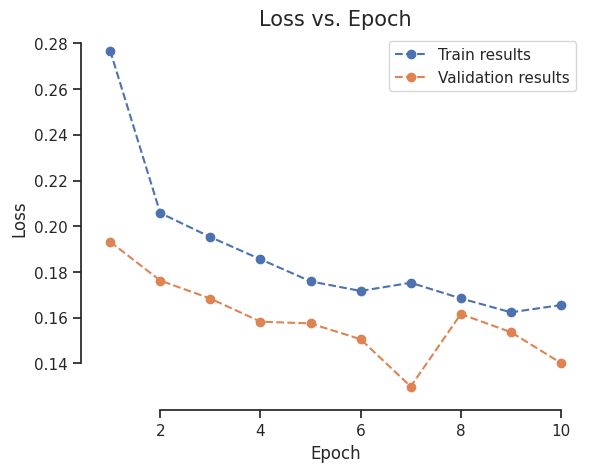

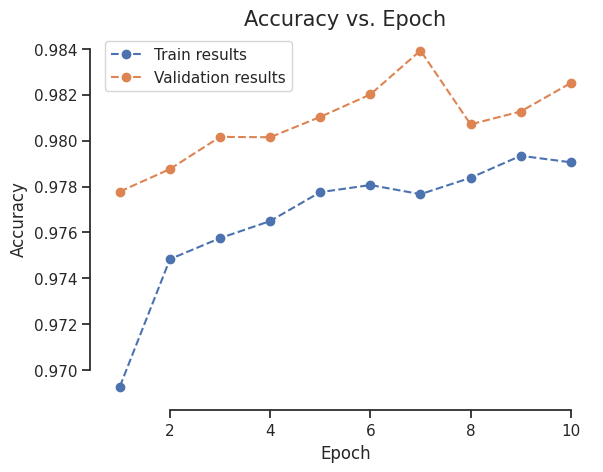

In [67]:
# train the denoising network
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
metric = PSNR()
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, dice_score, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

In [68]:
# create the test dataset
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x, var=0.1), x)
)

/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


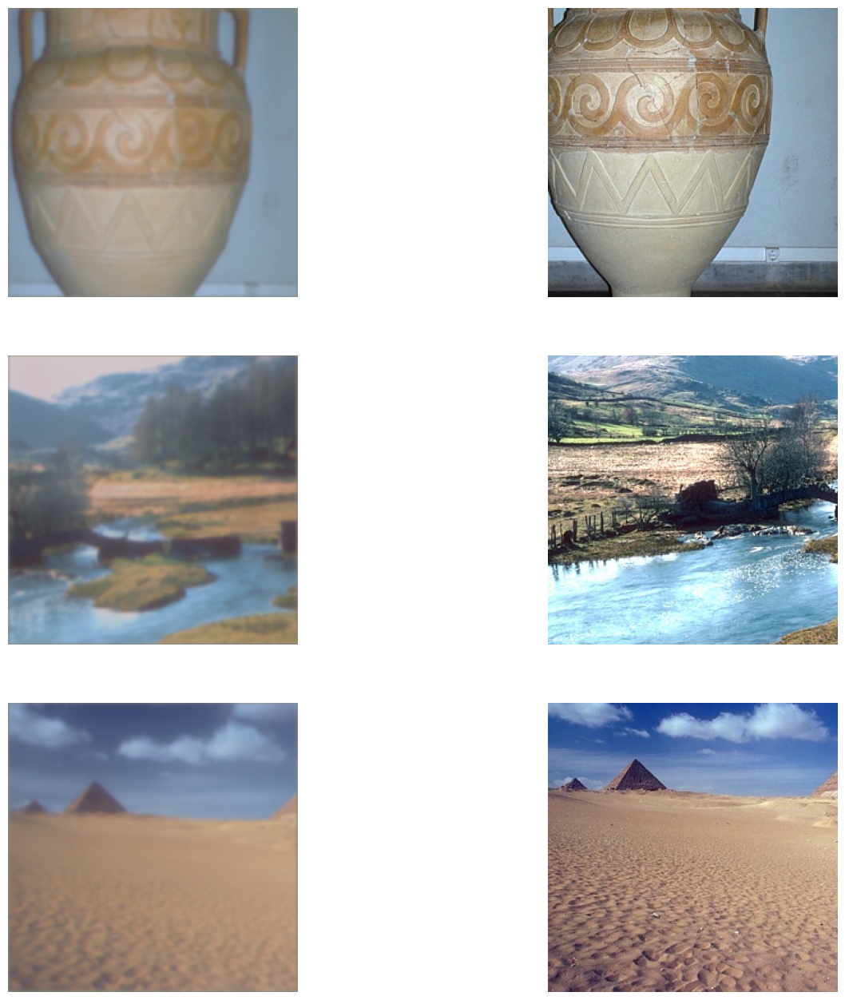

In [69]:
# TODO display some results on the test data

# sample a few images from the train dataset
fig, ax = plt.subplots(3, 2, figsize=(16, 16))
for ii in range(3):
    clean = vsdr_test_ds[ii][1]
    noisy =  model(torch.tensor(vsdr_test_ds[ii][1])[None].to(device)).cpu().reshape((3,256,256)).detach().numpy()
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(np.array(clean)))
plt.show()

## Train a network with noisy targets (Gaussian noise)

Now, we train a network from noisy inputs AND noisy targets. And compare its results to the previous denoising network learned on clean targets.

QUESTION:
- Why can the model learn denoising even though we also have a noisy target?

**Answer**
* it can be derived mathematically. To keep it short: mean zero noise on the targets doesn't statistically changes the prediction

In [70]:
# instantiate new model and loss
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [71]:
# TODO create dataset with corrupted input and target
# use same variance as before (0.1)
vsdr_gaussian1 = VsdrDataset(vsdr_train, additive_gaussian_noise)
vsdr_gaussian2 = VsdrDataset(vsdr_train, additive_gaussian_noise)
noise_dataset = CustomDataset(vsdr_gaussian1, vsdr_gaussian2)
generator1 = torch.Generator().manual_seed(42)

vsdr_train_ds, vsdr_val_ds = torch.utils.data.random_split(noise_dataset, [.9, .1], generator=generator1)

  0%|          | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)
/tmp/ipykernel_47/2720794063.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_1, input_2, target1, target2 = torch.tensor(input_[:,0,:,:]).flatten(), torch.tensor(input_[:,1,:,:]).flatten(), torch.tensor(target[:,0,:,:]).flatten(), torch.tensor(target[:,1,:,:]).flatten()
 10%|█         | 1/10 [00:22<03:19, 22.19s/it]

Train loss:0.25845047229424467 train accc:0.9689190975108812val loss:0.22635248421054138 val accc:0.973240149648566


 20%|██        | 2/10 [00:44<02:58, 22.27s/it]

Train loss:0.24830991081720175 train accc:0.9698455583217532val loss:0.22346682709298635 val accc:0.9744188173821098


 30%|███       | 3/10 [01:06<02:36, 22.32s/it]

Train loss:0.24368316143058066 train accc:0.9700987065254256val loss:0.25089580997040395 val accc:0.9707008255155463


 40%|████      | 4/10 [01:29<02:13, 22.28s/it]

Train loss:0.24014253429202145 train accc:0.9710392903449924val loss:0.24264597382984662 val accc:0.9717432668334559


 50%|█████     | 5/10 [01:51<01:51, 22.32s/it]

Train loss:0.23702149862033683 train accc:0.9709649595410325val loss:0.24093892503725856 val accc:0.9707773516052648


 60%|██████    | 6/10 [02:13<01:29, 22.34s/it]

Train loss:0.24294701911682307 train accc:0.970406461766986val loss:0.2264587424303356 val accc:0.972892690646021


 70%|███████   | 7/10 [02:36<01:07, 22.39s/it]

Train loss:0.2350764521289357 train accc:0.970997022681458val loss:0.22430182032679258 val accc:0.9742295804776644


 80%|████████  | 8/10 [02:58<00:44, 22.39s/it]

Train loss:0.2350079660022328 train accc:0.9714467088843501val loss:0.2274278961122036 val accc:0.9729411507907667


 90%|█████████ | 9/10 [03:21<00:22, 22.38s/it]

Train loss:0.23328344788142416 train accc:0.9713705417721771val loss:0.22683791698593841 val accc:0.9734393766051844


100%|██████████| 10/10 [03:43<00:00, 22.34s/it]

Train loss:0.23825752169846795 train accc:0.9709340138144271val loss:0.23094097387633825 val accc:0.9722427317970678


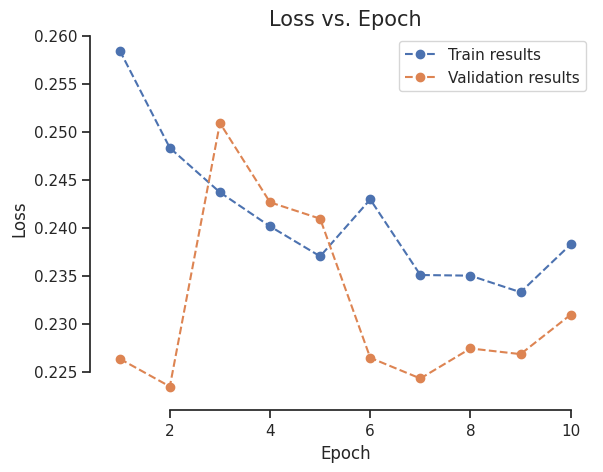

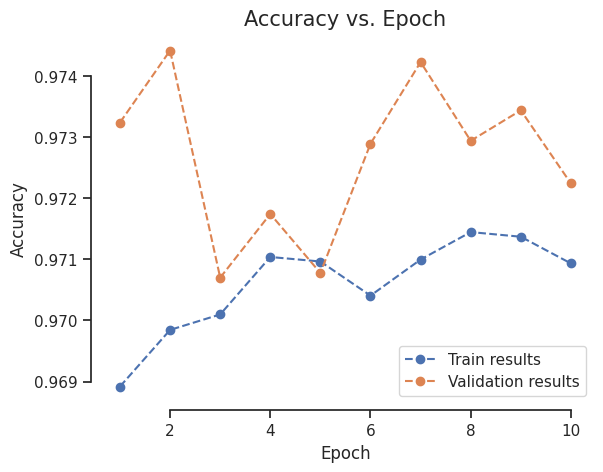

In [72]:
# train the model
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
train_losses, train_accs, val_losses, val_accs = run_training(model, train_loader, val_loader, loss, dice_score, optimizer, n_epochs)
plot('Loss vs. Epoch', 'Loss', train_losses, val_losses)
plot('Accuracy vs. Epoch', 'Accuracy', train_accs, val_accs)

/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])


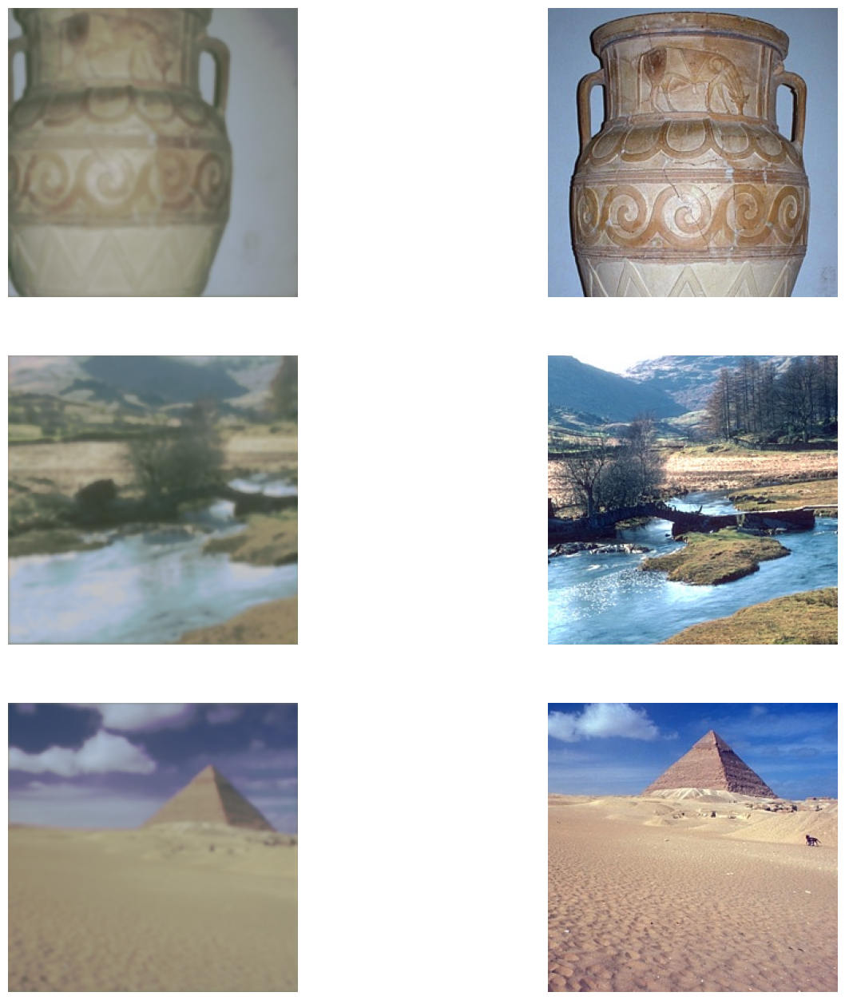

In [73]:
# TODO display some results on the test data

fig, ax = plt.subplots(3, 2, figsize=(16, 16))
for ii in range(3):
    clean = vsdr_test_ds[ii][1]
    noisy =  model(torch.tensor(vsdr_test_ds[ii][1])[None].to(device))
    print(noisy.shape)
    noisy = noisy.cpu().reshape((3,256,256)).detach().numpy()
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(np.array(clean)))
plt.show()

In [74]:
# TODO compute the PSNR for the whole test dataset
psnr = PSNR()

In [75]:
out = list()

for el in vsdr_test_ds:
    ans = psnr(model(torch.tensor(el[1])[None].to(device)).reshape((3,256,256)), torch.tensor(el[1]))
    out.append(ans)

/tmp/ipykernel_47/1212848519.py:70: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x, dtype=torch.float)


In [76]:
np.mean(out), np.std(out)

(16.097224535229355, 2.2269376115284567)

**QUESTIONS**:
- Compare the result between the network trained with clean targets and with noisy targets.

* There might be minor differences, but the images are not distinguishable with the naked eye

## [Optional] Train a network with noisy targets (Poisson noise)

Use poisson noise instead of gaussian noise and compare to both the network trained with clean target and the network with the target corrupted by gaussian noise.

In [77]:
# TODO run training with poisson noise and compare with previous results